In [2]:
import numpy as np
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
import cv2

# Импортируем изображение, как массив

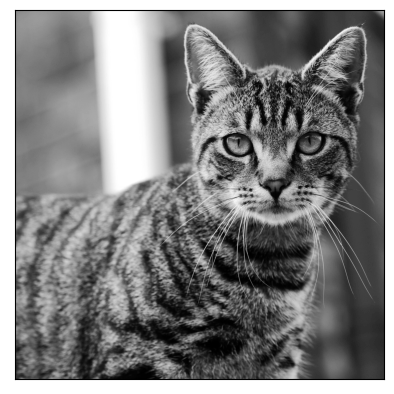

In [23]:
img = cv2.imread('cat.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(img,cmap=plt.cm.gray);
ax = plt.gca ()
ax.get_xaxis ().set_visible ( False )
ax.get_yaxis ().set_visible ( False )

Проверяем размерность изображения

In [15]:
img.shape

(1800, 1800)

# Используем метод главных компонент для сжатия

In [5]:
pca = PCA(0.75)

In [6]:
imgPCA = pca.fit_transform(img)
imgPCA.shape

(1800, 16)

Восстанавливаем изображение

In [7]:
imgPCA = pca.inverse_transform(imgPCA)

Отображаем полученное методом изображение

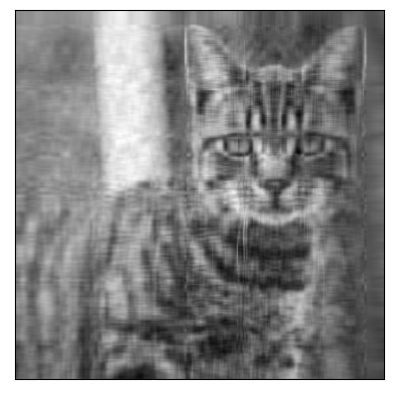

In [31]:
plt.imshow(imgPCA, cmap=plt.cm.gray);
ax = plt.gca ()
ax.get_xaxis ().set_visible ( False )
ax.get_yaxis ().set_visible ( False )

# Используем метод разложения по сингулярным значениям

In [9]:
U,s,V = np.linalg.svd(img)

Узнаем размерности полученных матриц

In [17]:
np.shape(s)

(1800,)

In [18]:
np.shape(U)

(1800, 1800)

In [19]:
np.shape(V)

(1800, 1800)

Восстанавливаем по 16 компонентам

In [27]:
k = 16
S = np.zeros(np.shape(img))
for i in range(0, k):
    S[i,i] = s[i]

In [28]:
imgSVD = U @ S @ V
imgSVD.shape

(1800, 1800)

Отображаем полученное методом изображение

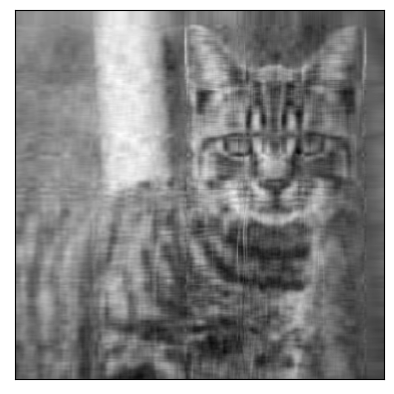

In [29]:
plt.imshow(imgSVD, cmap=plt.cm.gray);
ax = plt.gca ()
ax.get_xaxis ().set_visible ( False )
ax.get_yaxis ().set_visible ( False )

Отображаем все 3 изображения для сравнения

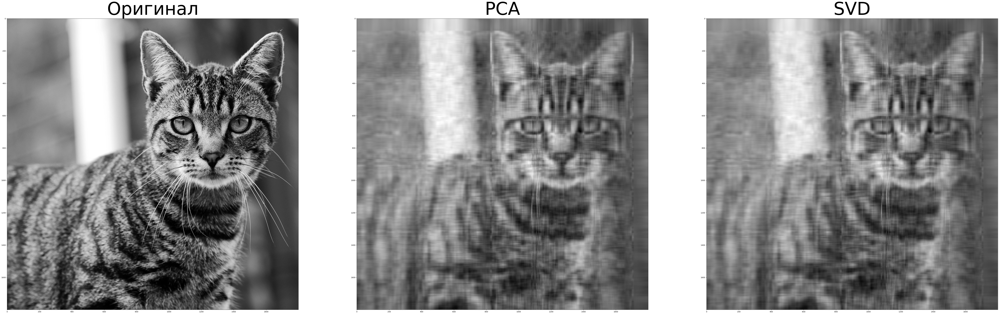

In [30]:
plt.figure(figsize=(100,50));

plt.subplot(1,3,1);
plt.imshow(img,cmap=plt.cm.gray)
plt.title('Оригинал', fontsize = 100);

plt.subplot(1, 3, 2);
plt.imshow(imgPCA,cmap=plt.cm.gray)
plt.title('PCA', fontsize = 100);

plt.subplot(1, 3, 3);
plt.imshow(imgSVD,cmap=plt.cm.gray)
plt.title('SVD', fontsize = 100);